In [16]:
#import
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import math

# Nelder Mead method

Implement Nelder-Mead method for the Mishra’s Bird function 

$$f(x,y)=\sin(y)e^{(1−\cos x)^2} +\cos(x)e^{(1−\sin y)^2} +(x−y)^2$$

with the domain 

$$(x+5)^2+(y+5)^2 < 25$$


In [17]:
# Mishra’s Bird function
def f(x):
    return np.sin(x[1]) * np.exp(1-np.cos(x[0]))**2 + np.cos(x[0])*np.exp(1-np.sin(x[1]))**2 + (x[0]-x[1])**2

In [18]:
#Terms of limitation in the circle
def constraint(x):
    if (x[0] + 5)**2 + (x[1] + 5)**2 < 25:
        return True
    else:
        return False

In [19]:
x = np.arange(-10, 0, 0.1)
y = np.arange(-10, 0, 0.1)

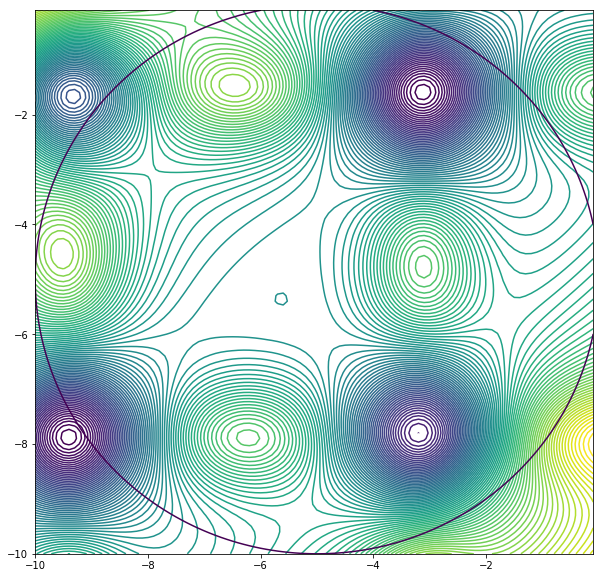

In [72]:
#plot our function
def plot_problem():
    plt.subplots(figsize=(10, 10))

    X, Y = np.meshgrid(x, y)
    Z = np.zeros((x.size, y.size))
    for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = f([x[i], y[j]])

    plt.contour(X, Y, Z.T, 100)
    plt.contour(X, Y, (X + 5)**2 + (Y + 5)**2 - 25, [0])
    plt.show()
plot_problem()

### Solution

In [230]:
#"Drag" the point in the circle, if it "came out"    
def fit_constraint (X):
    x_v, y_v = X
    if (constraint(X)==False):
        x_0 = -5 
        y_0 = -5
        x = x_0 + 5*(x_v - x_0)/np.sqrt((x_v - x_0)**2 + (y_v - y_0)**2)
        y = y_0 + (x - x_0)*(y_v - y_0)/(x_v - x_0);
        X = [x, y]
    return X

In [250]:
# Method parameters
alpha = 1
beta = 0.5
gamma = 2
n = 3
max_iter =  200 #if we don't find the optimum
epsilon = 1e-3

#initial points:
point_1 = [-5, -5]
point_2 = [-6, -2]
point_3 = [-3, -4]

In [251]:
def Nelder_Mead (alpha, beta, gamma, n, epsilon, max_iter, v1, v2, v3):
    plt.subplots(figsize=(10, 10))
    for i in range(max_iter):
        #print(i)
        #sorting:
        V = [[f(v1), v1], [f(v2), v2], [f(v3), v3]]
        V = sorted(V)
        x_l = np.array(V[0][1]) #lowest
        x_g = np.array(V[1][1]) #good
        x_h = np.array(V[2][1]) #highest

        #center:
        x_c = (x_g + x_l)/2
        
        #reflection
        x_r = x_c + alpha * (x_c - x_h)
        f_r = f(x_r)
        f_l = f(x_l)
        f_g = f(x_g)
        f_h = f(x_h)

        if(f_r < f_l):
            x_e = (1 - gamma)*x_c + gamma*x_r
            f_e = f(x_e)
            if(f_e < f_r):
                x_h = x_e;
            else:
                x_h = x_r;          
        elif (f_l < f_r) & (f_r < f_g):
            x_h = x_r;
        else:
            if (f_g < f_r) & (f_r < f_h):
                temp = x_h; x_h = x_r; x_r = temp;
                temp =f_h;  f_h = f_r; f_r = temp;
            x_s = beta*x_h + (1-beta)*x_c; f_s = f(x_s);
            if (f_s < f_h):
                x_h = x_s;
            else:
                x_h = x_l + (x_h-x_l)/2;  x_g = x_l + (x_g-x_l)/2
        
        v1 = fit_constraint(x_l); v2 = fit_constraint(x_g); v3 = fit_constraint(x_h)
          
        def area(a, b, c):
            def distance(p1, p2):
                return math.hypot(p1[0]-p2[0], p1[1]-p2[1])

            side_a = distance(a, b)
            side_b = distance(b, c)
            side_c = distance(c, a)
            s = 0.5 * ( side_a + side_b + side_c)
            return math.sqrt(s * (s - side_a) * (s - side_b) * (s - side_c))
       
        #plt.subplots(figsize=(10, 10)) comment out if you need to look at each triangle separately
        X, Y = np.meshgrid(x, y)
        Z = np.zeros((x.size, y.size))
        for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = f([x[i], y[j]])

        plt.contour(X, Y, Z.T, 100)
        plt.contour(X, Y, (X + 5)**2 + (Y + 5)**2 - 25, [0])
        
        plt.title('Alpha = %d, Beta =%d, Gamma =%d' % (alpha, beta, gamma))
        
        plt.plot([x_l[0], x_g[0], x_h[0], x_l[0]],[x_l[1], x_g[1], x_h[1], x_l[1]])
        
        
        if (area(x_l, x_g, x_h) < epsilon):
            break
    print('Solution:', v1, ' Value: ' ,f(x_l))

Illustration the behavior of the methods plot simplex (triangle) for every iteration.

Solution: [-3.1907692 -7.7606771]  Value:  -87.40513318774124


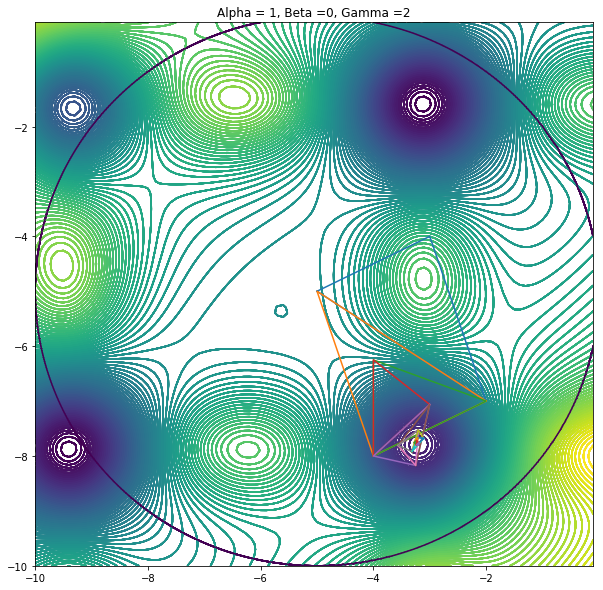

In [237]:
Nelder_Mead(alpha, beta, gamma, n, epsilon, max_iter, point_1, point_2, point_3)

Demonstration that the algorithm may converge to different points depending on the starting point.

Solution: [-3.17536926 -7.80325317]  Value:  -87.47523517936155


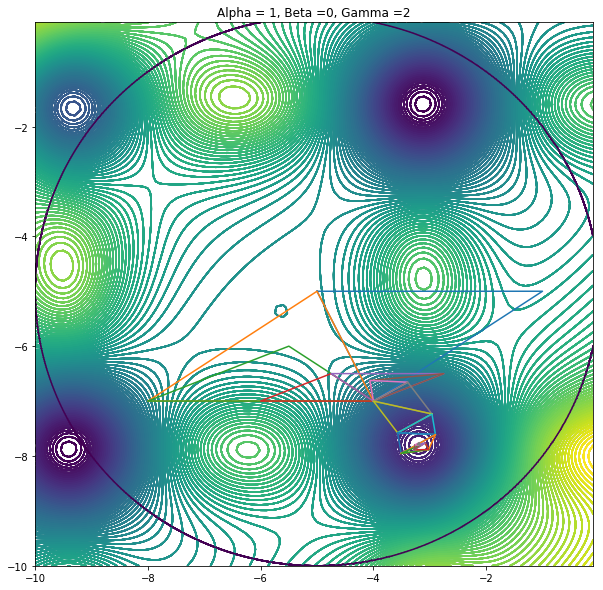

In [238]:
point_1 = [-1, -1]
point_2 = [-5, -5]
point_3 = [-1, -5]

Nelder_Mead(alpha, beta, gamma, n, epsilon, max_iter, point_1, point_2, point_3)

#### Other minimum

Solution: [-3.12057513 -1.56342596]  Value:  -106.73096876555734


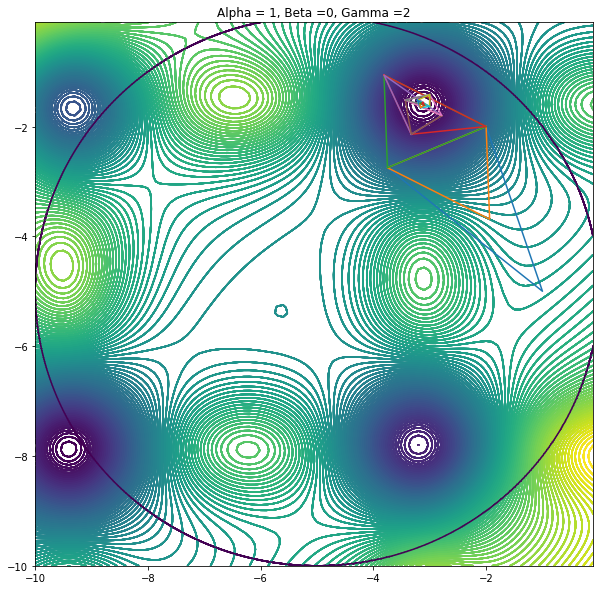

In [239]:
point_1 = [-2, -2]
point_2 = [-6, -2]
point_3 = [-1, -5]

Nelder_Mead(alpha, beta, gamma, n, epsilon, max_iter, point_1, point_2, point_3)

#### Way out of limitation

Solution: [-3.10661091 -1.60615621]  Value:  -106.74250630808672


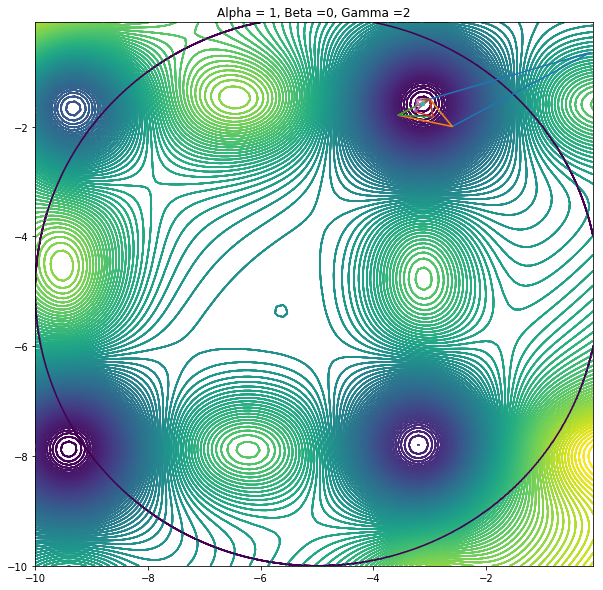

In [248]:
point_1 = [np.random.choice(x), np.random.choice(y)]
point_2 = [np.random.choice(x), np.random.choice(y)]
point_3 = [np.random.choice(x), np.random.choice(y)]


Nelder_Mead(alpha, beta, gamma, n, epsilon, max_iter, point_1, point_2, point_3)

(3 points) Examine the behavior of the method for various parameters α, β and γ. For one chosen x0 show that the method may converge to different points. Report parameter values and x∗.

Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-2.7121911  -1.40308046]  Value:  -91.44776567440285
Solution: [-2.74910593 -1.40395567]  Value:  -93.49974623611968
Solution: [-3.12643957 -1.62295866]  Value:  -106.69449364022967
Solution: [-2.72106266 -1.56361103]  Value:  -94.36468632576828
Solution: [-2.7622475  -1.51956541]  Value:  -96.33905329622435
Solution: [-2.99766541 -1.35771179]  Value:  -101.22563396622884
Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-2.99890137 -1.68278809]  Value:  -104.80264667712792
Solution: [-3.12057513 -1.56342596]  Value:  -106.73096876555734
Solution: [-3.12057513 -1.56342596]  Value:  -106.73096876555734
Solution: [-3.125 -1.625]  Value:  -106.68347617322127
Solution: [-3.115625 -1.615625]  Value:  -106.72672086163016
Solution: [-3.125 -1.

/Users/renatarenata/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Solution: [-2 -2]  Value:  -34.395245284912434
Solution: [-3.13617551 -1.6843909 ]  Value:  -106.03511148257785
Solution: [-3.09745335 -1.57918167]  Value:  -106.7259711695851
Solution: [-3.09745335 -1.57918167]  Value:  -106.7259711695851
Solution: [-3.14778328 -1.60454369]  Value:  -106.71834821927567
Solution: [-3.13947526 -1.58728258]  Value:  -106.76437399340409
Solution: [-3.16015625 -1.61328125]  Value:  -106.6275825853877


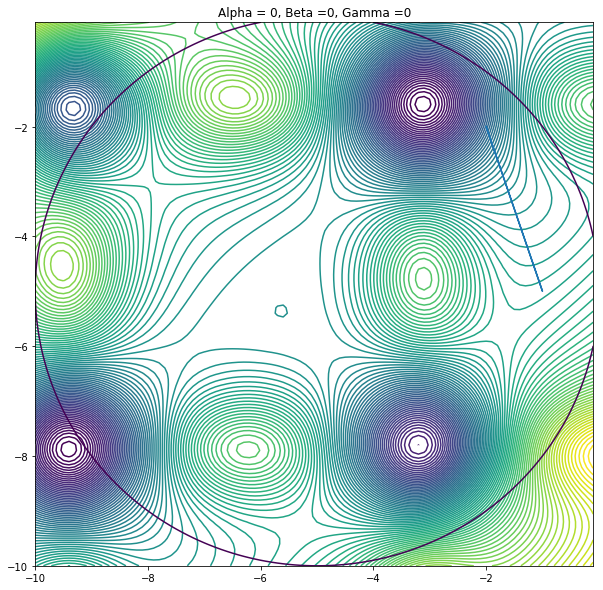

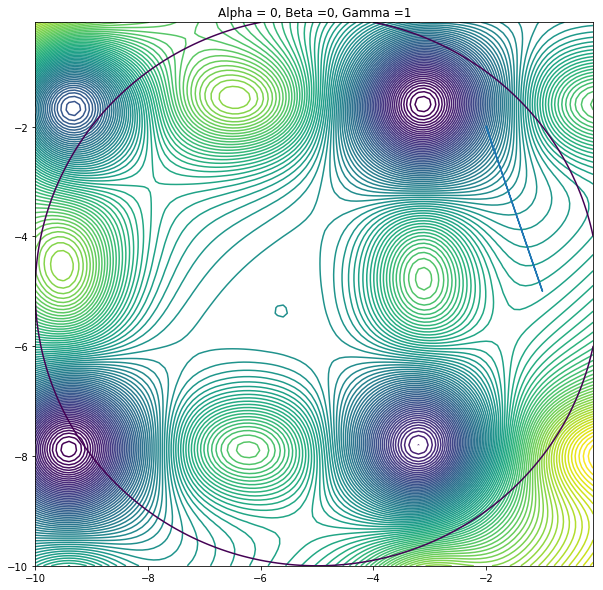

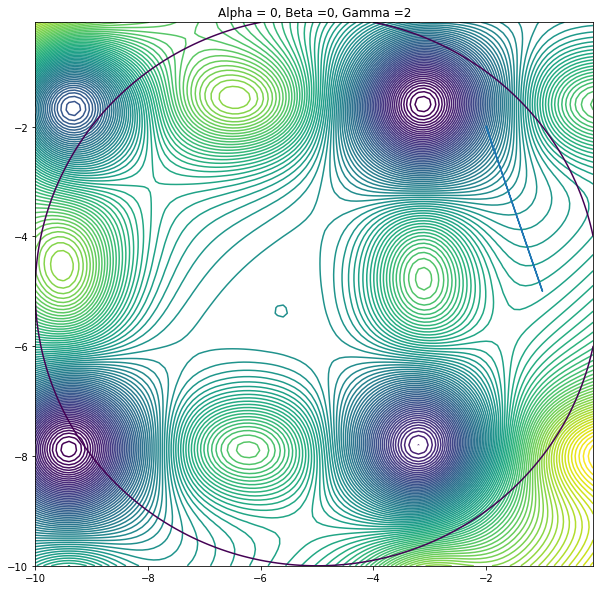

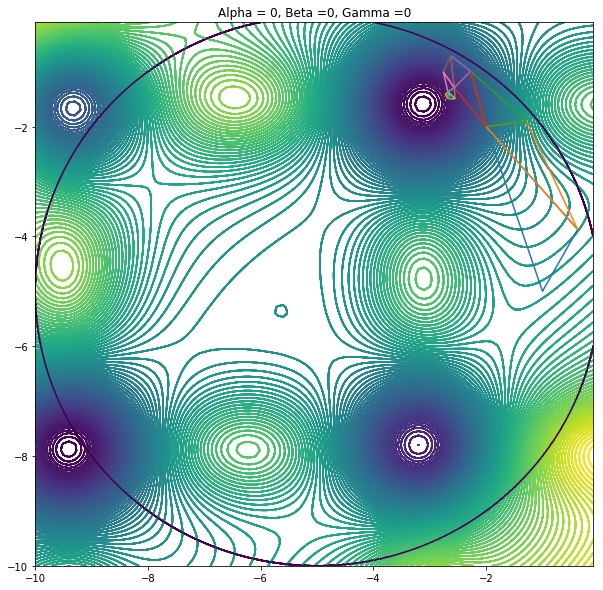

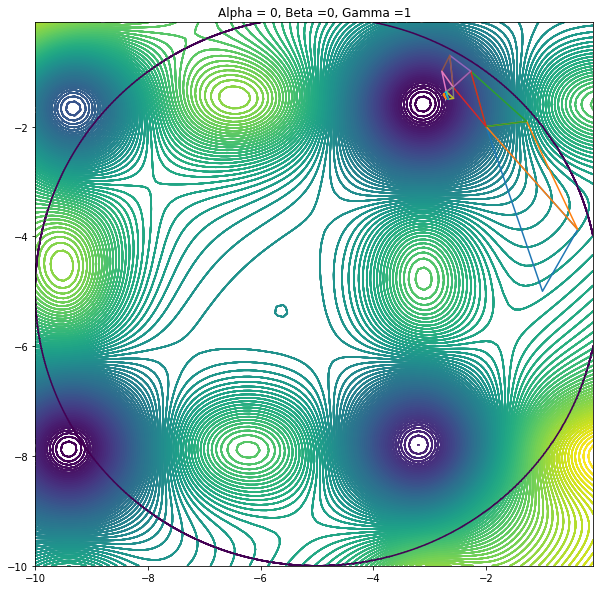

...

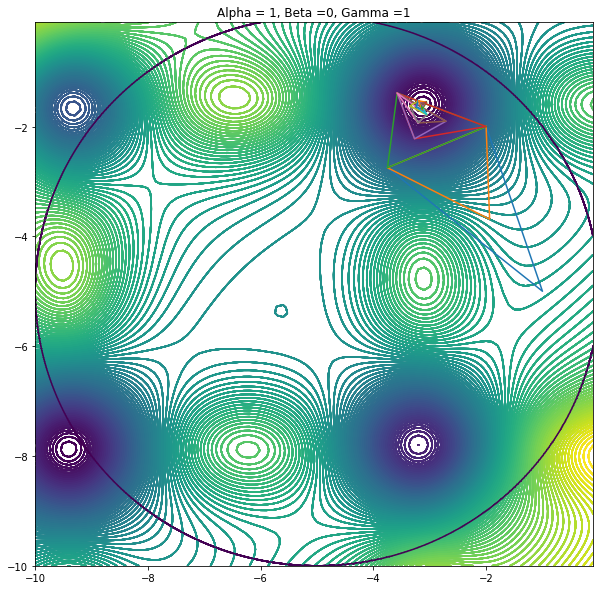

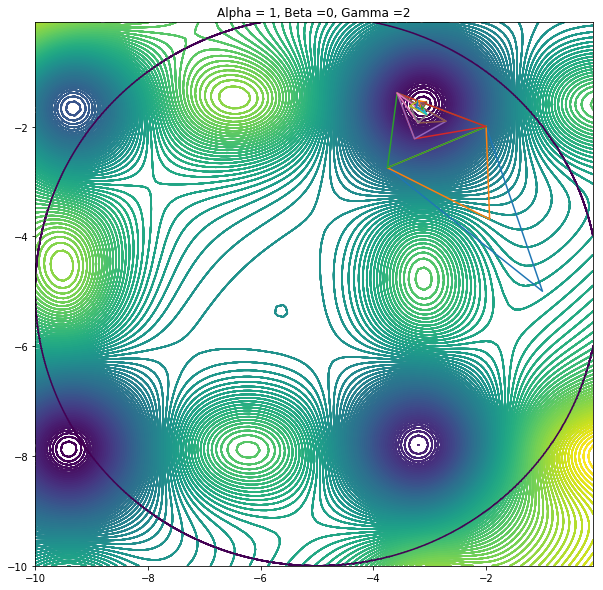

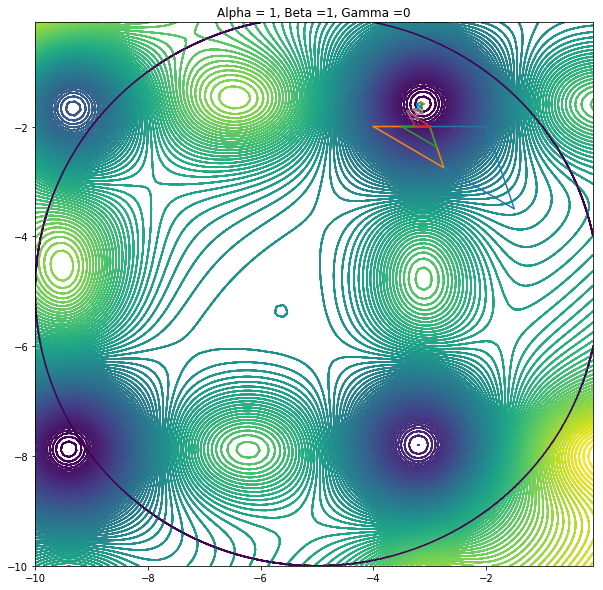

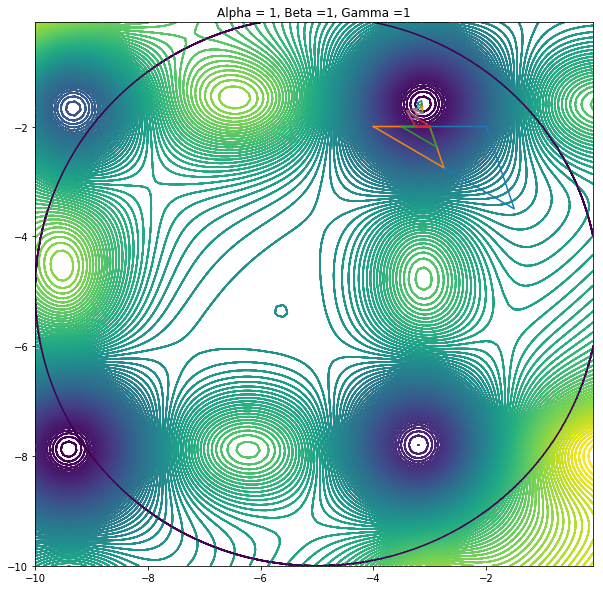

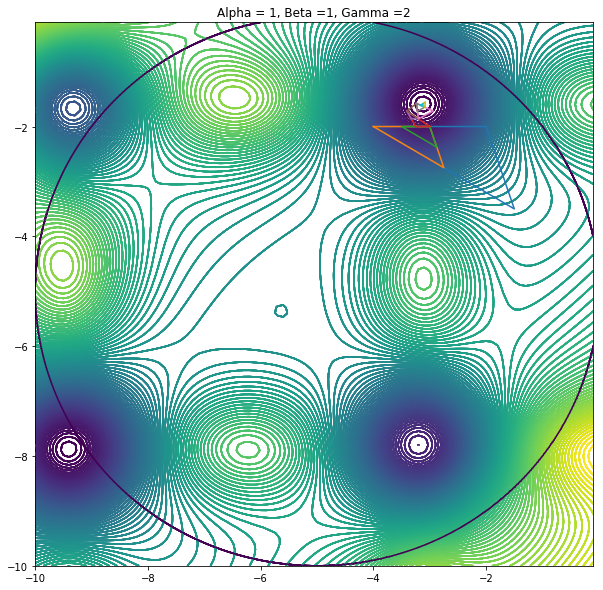

In [252]:
point_1 = [-2, -2]
point_2 = [-6, -2]
point_3 = [-1, -5]

alphas = np.linspace(0.5, 1.5, 3)
betas = np.linspace(0, 1, 3)
gammas = np.linspace(0.1, 2, 3)


for alpha in alphas:
    for beta in betas:
        for gamma in gammas:
            Nelder_Mead(alpha, beta, gamma, n, epsilon, max_iter, point_1, point_2, point_3)

### Conclusion:

With some alpha, beta and gamma the minimum is not reached for this maximum number of iterations. Some alpha, beta and gamma can degenerate a triangle and the process stops. The choice of the parameters of the method greatly affects the rate of convergence and its implementation.

## The embedded solution

In [253]:
from scipy import optimize

starting_guess = [-2, -7]
optimize.minimize(f, starting_guess, method='Nelder-Mead',options={'xtol': 1e-6})

 final_simplex: (array([[-3.19802343, -7.79755066],
       [-3.19802404, -7.79755054],
       [-3.19802381, -7.79755017]]), array([-87.5202988, -87.5202988, -87.5202988]))
           fun: -87.52029879773605
       message: 'Optimization terminated successfully.'
          nfev: 101
           nit: 54
        status: 0
       success: True
             x: array([-3.19802343, -7.79755066])

In [254]:
starting_guess = [-3, -1]
optimize.minimize(f, starting_guess, method='Nelder-Mead',options={'xtol': 1e-6})

 final_simplex: (array([[-3.12285985, -1.58952897],
       [-3.12286016, -1.58952816],
       [-3.1228597 , -1.58952798]]), array([-106.78773369, -106.78773369, -106.78773369]))
           fun: -106.78773368603123
       message: 'Optimization terminated successfully.'
          nfev: 93
           nit: 48
        status: 0
       success: True
             x: array([-3.12285985, -1.58952897])

### Conclusion:
The embedded solution gives the same results as our method. HOORAY!

# 4 Coordinate descend

Implement coordinate descend for $x_0$ and $f$ from Task 3. Compare the number of function evaluations (Oracle calls) for Nelder Mead algorithm and Coordinate descend. Report parameters of the algorithm. Provide the link to code repository. Make a conclusion.

In [258]:
#Initial points
Y_opt = -2
X_opt = -7

#cut ends
a = -10
b = 0

#stop criteria
delta = 0.2
epsilon = 1e-10

max_iter = 200

In [259]:
for j in range(max_iter):
    
    b = -5 + (25 - (Y_opt + 5)**2)**0.5
    a = -5 - (25 - (Y_opt + 5)**2)**0.5
    
    for i in range(max_iter):
        f_1 = f([(a + b)/2 - delta, Y_opt])
        f_2 = f([(a + b)/2 + delta, Y_opt])
        if f_1 < f_2:
            b = (a + b)/2 + delta
        else:
            a = (a + b)/2 - delta
        l = abs(b - a) 
        if l < 2*epsilon:
            break
    X_n = X_opt
    X_opt = (a+b)/2
    
    #new alpha and beta (depend on the circumference)
    b = -5 + (25-(X_opt + 5)**2)**0.5
    a = -5 - (25-(X_opt + 5)**2)**0.5

    for i in range(max_iter):
        f_1 = f([X_opt, (a+b)/2 - delta])
        f_2 = f([X_opt, (a+b)/2 + delta])
        if f_1 < f_2:
            b = (a + b)/2 + delta
        else:
            a = (a + b)/2 - delta
        l = abs(b-a) #length check 
        if l < 2*epsilon:
            break
    Y_n = Y_opt
    Y_opt = (a + b)/2
    #print(X_n, X_opt,Y_n, Y_opt)
    if (abs(X_n - X_opt) < epsilon) & (abs(Y_n - Y_opt)< epsilon): 
        break

print('Oracle calls of Coordinate descend: ', j)
print('Solution:', [X_opt, Y_opt])

Oracle calls of Coordinate descend:  4
Solution: [-3.1998859918273483, -7.7956882957369285]


In [255]:
def Nelder_Mead_2 (alpha, beta, gamma, n, epsilon, maxit, v1, v2, v3):
    #initial points:  
    #initial points:
    """
    point_1 = [np.random.choice(x), np.random.choice(y)]
    point_2 = [np.random.choice(x), np.random.choice(y)]
    point_3 = [np.random.choice(x), np.random.choice(y)]
    """
    
    #v1 = [-5, -5]
    #v2 = [-6, -2]
    #v3 = [-3, -4]

    for i in range(maxit):
        #print(i)
        #sorting:
        V = [[ f(v1),v1],[f(v2),v2], [f(v3),v3]]
        V = sorted(V)
        xl = np.array(V[0][1]) #lowest
        xg = np.array(V[1][1]) #good
        xh = np.array(V[2][1]) #highest

        #center:
        xc = (xg + xl)/2


        #reflection
        xr = xc + alpha * (xc - xh)
        fr = f(xr); fl = f(xl); fg = f(xg); fh = f(xh)

        if(fr < fl):
            xe = (1-gamma)*xc + gamma*xr;     fe = f(xe)
            if(fe < fr):
                xh = xe;
            else:
                xh = xr;          
        elif (fl < fr) & (fr < fg):
            xh = xr;
        else:
            if (fg < fr) & (fr < fh):
                temp = xh; xh = xr; xr = temp;
                temp =fh;  fh = fr; fr = temp;
            xs = beta*xh + (1-beta)*xc; fs = f(xs);
            if (fs<fh):
                xh = xs;
            else:
                xh = xl + (xh-xl)/2;  xg = xl + (xg-xl)/2
        
        v1 = fit_constraint(xl); v2 = fit_constraint(xg); v3 = fit_constraint(xh)
        
    
    #code from: http://code.activestate.com/recipes/576896-3-point-area-finder/    
        def area(a, b, c):
            def distance(p1, p2):
                return math.hypot(p1[0]-p2[0], p1[1]-p2[1])

            side_a = distance(a, b)
            side_b = distance(b, c)
            side_c = distance(c, a)
            s = 0.5 * ( side_a + side_b + side_c)
            return math.sqrt(s * (s - side_a) * (s - side_b) * (s - side_c))
       
        #plt.subplots(figsize=(10, 10)) comment out if you need to look at each triangle separately
        if (area(xl, xg, xh) < epsilon):
            break
    print('Oracle calls of Nelder Mead: ', i)
    print('Solution:', v1)

In [257]:
point_1 = [-2, -6]
point_2 = [-6, -2]
point_3 = [-1, -5]

alpha = 1
beta = 0.5
gamma = 2
n = 3
max_iter =  200 #if we don't find the optimum
epsilon = 1e-10

Nelder_Mead_2 (alpha, beta, gamma, n, epsilon, max_iter, point_1, point_2, point_3)

Oracle calls of Nelder Mead:  59
Solution: [-3.1980224  -7.79755543]


### Conclusion:

Despite the fact that the Nelder Mead method is very beautiful, it needs more iterations Oracle calls to get the same answer as the Coordinate descend. This is probably why this method is not as popular as the others.


## References

https://ru.wikipedia.org/wiki/Метод_Нелдера_—_Мида

https://en.wikipedia.org/wiki/Coordinate_descent

http://code.activestate.com/recipes/576896-3-point-area-finder/ 


http://fa.bianp.net/teaching/2018/COMP-652/scipy.optimize.html